In [64]:
import pandas as pd
df = pd.read_csv('full_database.csv')
df.head()
df = df.drop(df.columns[0], axis=1)
df = df.drop(df.columns[0], axis=1)

In [65]:
df.head()

,cuisine,recipe_ingredients,recipe_name
0,african,2 tbsp vegetable oil ½ tsp cumin seeds ½ tsp f...,Bunny chow
1,african,"1 tbsp olive or vegetable oil 2 large onions, ...",Jollof rice with fried plantains
2,african,400ml/14fl oz passata 3 tbsp tomato purée 2 fr...,Jollof rice
3,african,4g smoked paprika 2g cayenne pepper 6g ginger...,Suya fillet burger with sweet potato cubes and...
4,african,300g/10½oz basmati rice 1 tbsp vegetable oil 8...,Jollof rice with chicken


In [66]:
df.cuisine.value_counts()

greek                         166
thai_and_south-east_asian     158
irish                         149
american                      147
indian                        146
french                        139
japanese                      137
african                       127
korean                        118
italian                       105
mexican                       103
chinese                        74
british                        67
turkish_and_middle_eastern     64
pakistani                      24
nordic                         24
caribbean                      24
spanish                        24
east_european                  24
south_american                 18
portuguese                     15
Name: cuisine, dtype: int64

In [160]:
df = df.groupby('cuisine').filter(lambda x: len(x) >= 50)

In [164]:
df.to_csv('final_database.csv')

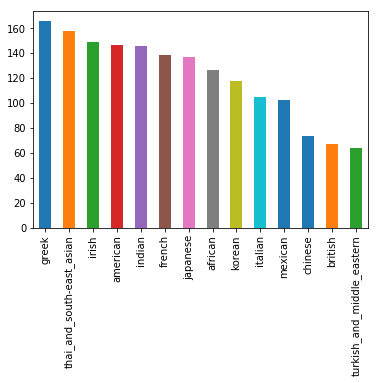

In [162]:
df['cuisine'].value_counts().plot(kind='bar')

In [68]:
import wordcloud
import matplotlib.pyplot as plt

In [69]:
' '.join(w for w in df[df.cuisine == "greek"].recipe_ingredients.tolist())

'750g/1lb 10½oz lamb mince 1 onion, finely chopped 2 garlic cloves, crushed 1 tsp dried oregano 1½ tsp dried mint 1 bay leaf 1 cinnamon stick 1 tbsp plain flour 200ml/7fl oz red wine 400g tin chopped tomatoes 2 tbsp tomato purée 2 aubergines, cut into 0.5cm slices 1 tbsp fine sea salt, plus extra for seasoning 100ml/3½fl oz olive oil 500g/1lb 2oz Maris Piper potatoes, peeled and thinly sliced freshly ground black pepper 50g/2oz butter 50g/2oz plain flour 400ml/14fl oz milk 25g/1oz Parmesan, finely grated 1 tsp finely grated nutmeg 1 free-range egg, beaten 150-175ml/5-6fl oz olive oil 1 large onion, finely chopped 3 garlic cloves, crushed 900g/2lb lamb mince 50ml/2 fl oz white wine (a generous splash) 1 x 400g tin chopped tomatoes 1 x 5cm/2in piece cinnamon stick handful fresh oregano leaves, preferably wild Greek oregano, chopped 3 large aubergines salt and freshly ground black pepper 75g/3oz butter 75g/3oz plain flour 600ml/1 pint milk 50g/2oz parmesan cheese, finely grated 2 medium f

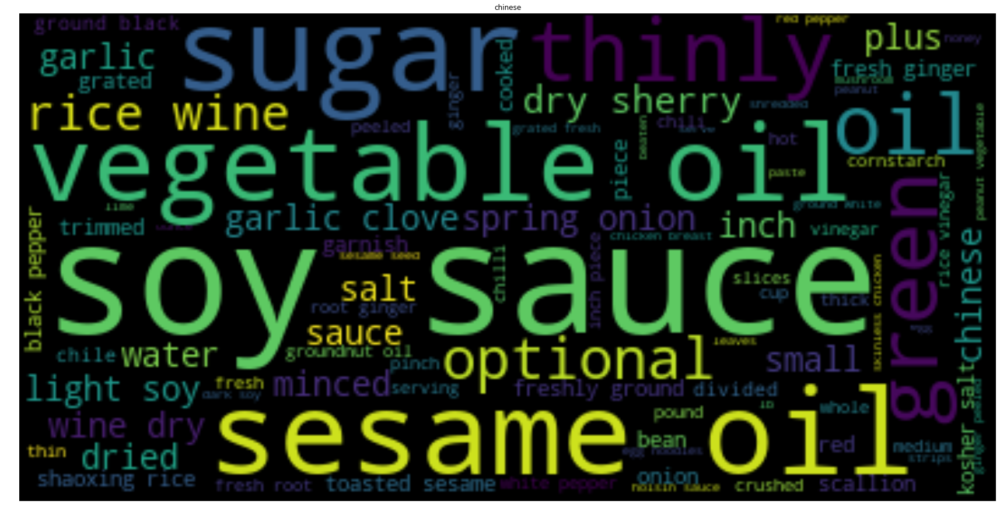

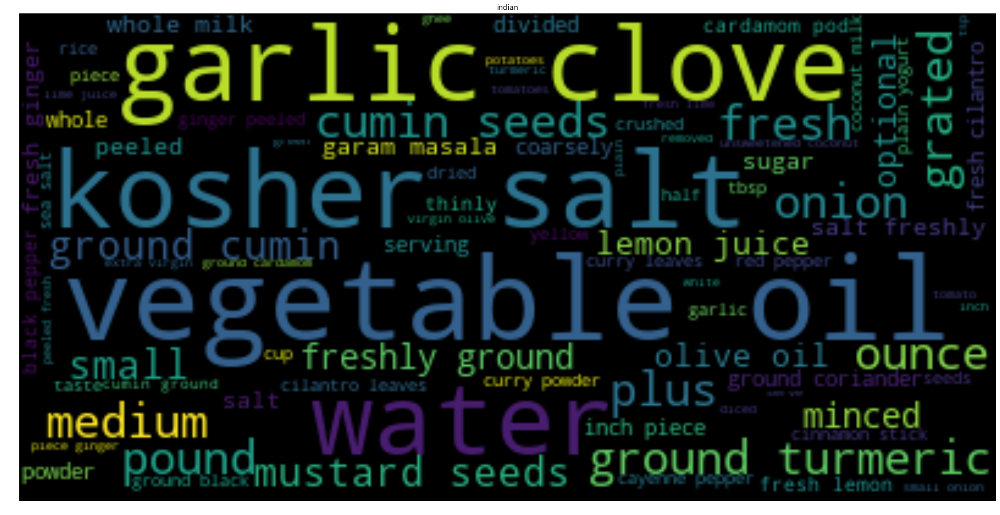

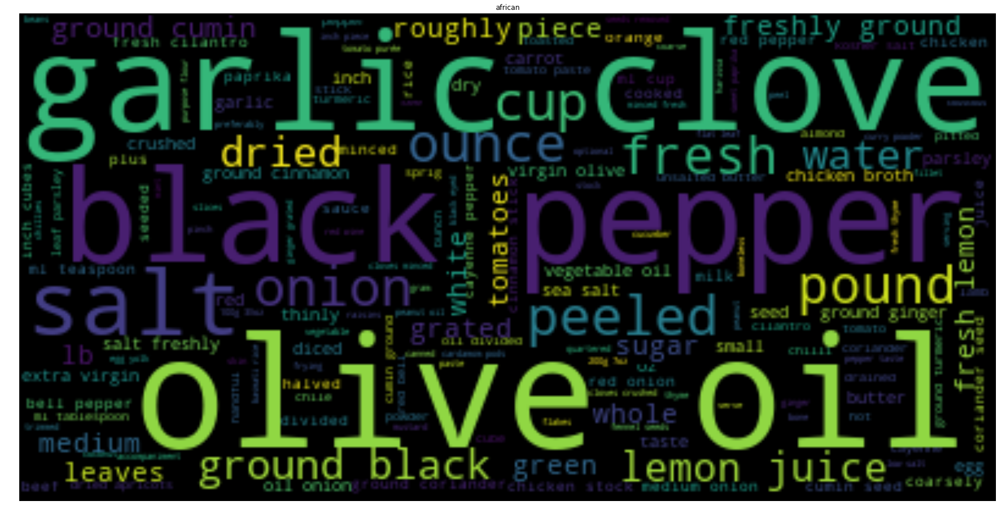

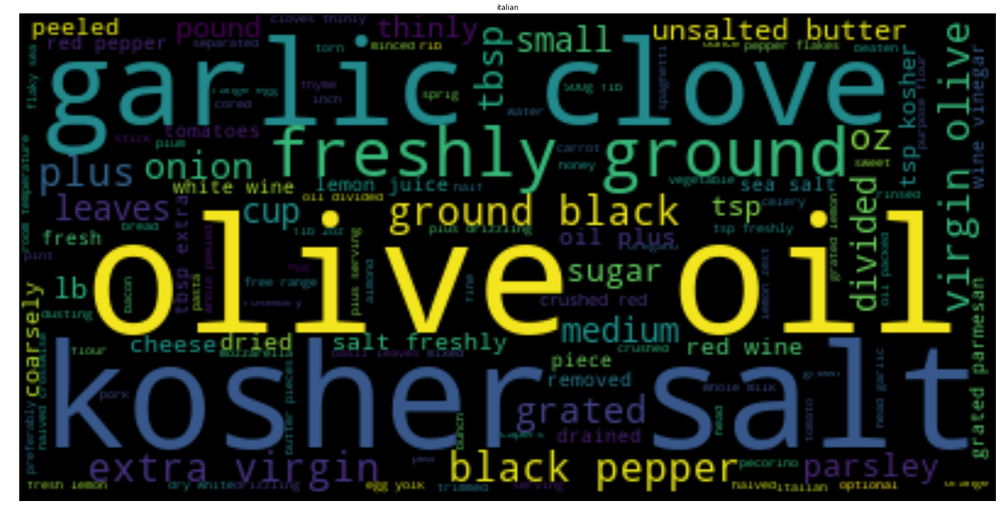

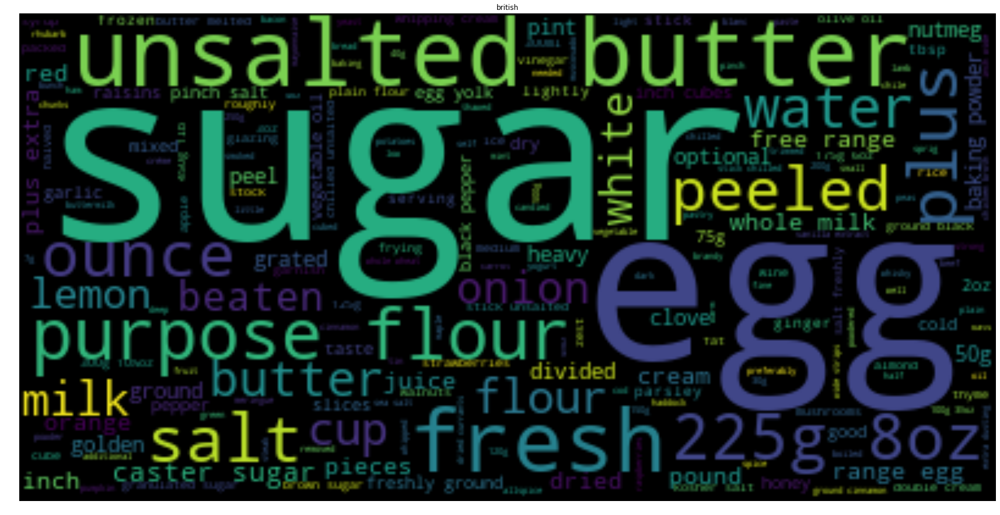

...

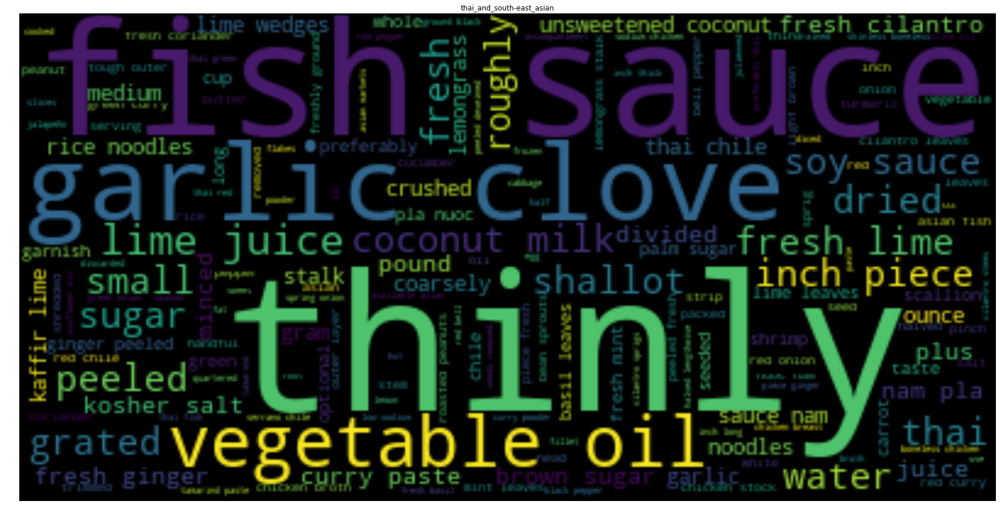

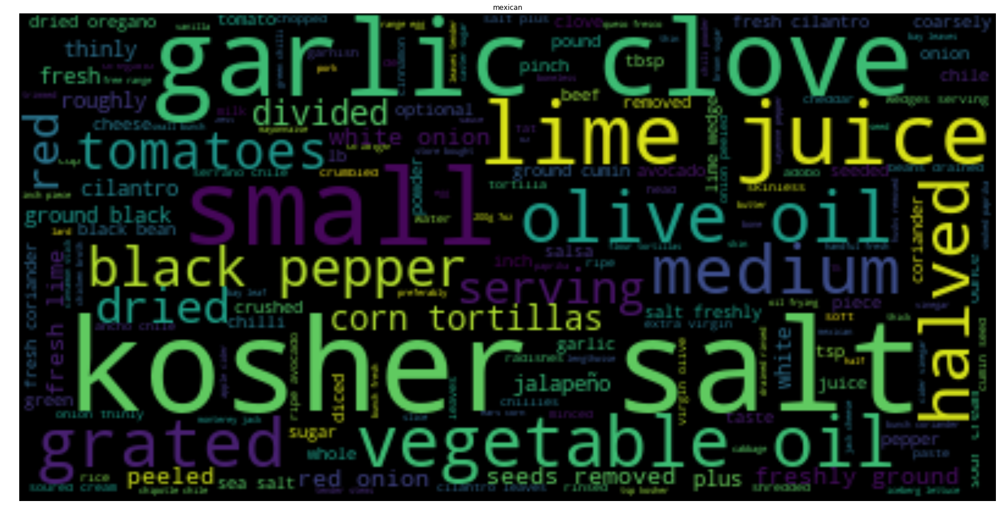

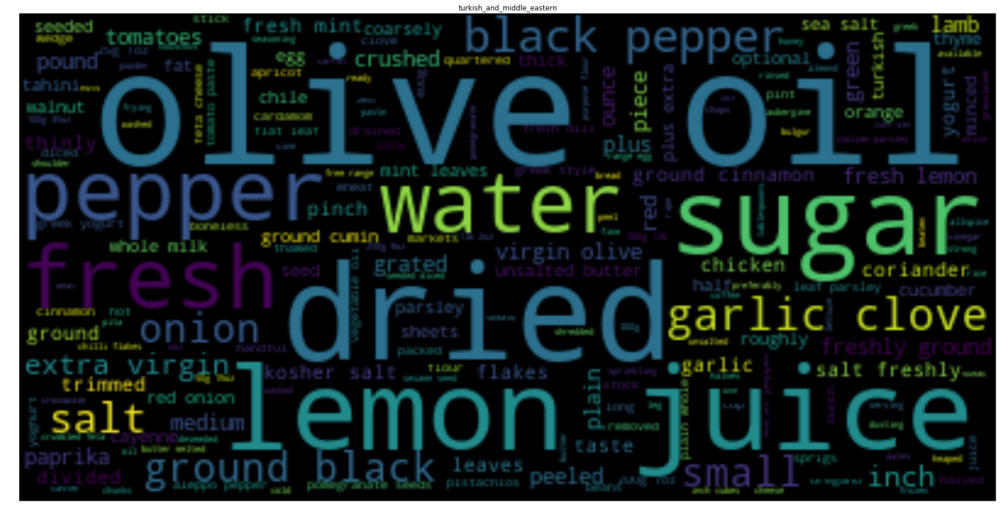

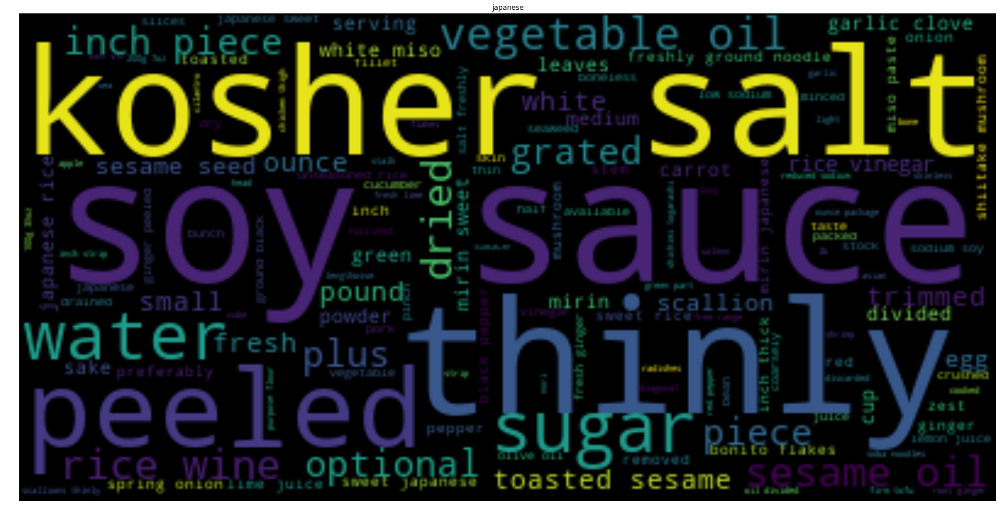

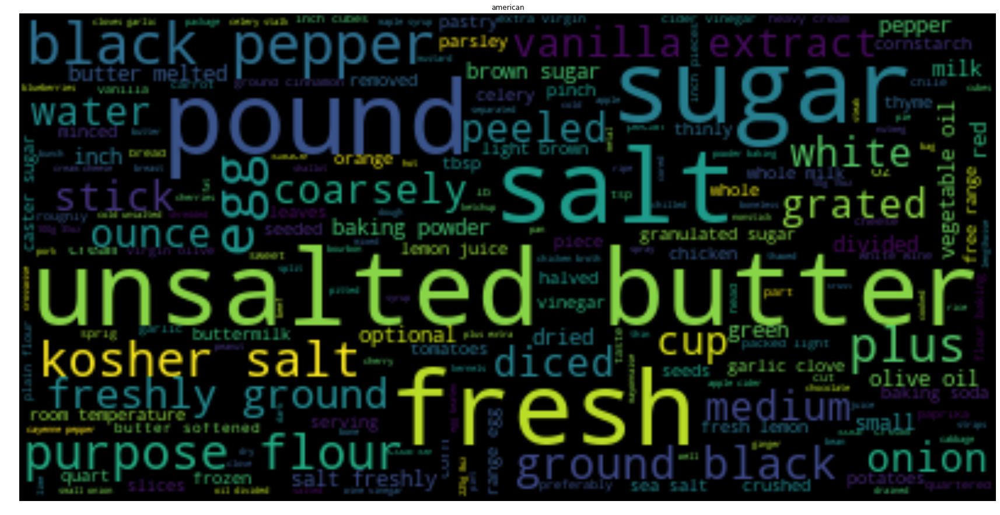

In [163]:
cuisines = set(df.cuisine.tolist())
stopwords = ['1','2','3','4','5','6','7','8','9', 'tsp','tbsp',
             'tablespoon', 'teaspoon', 'tablespoons', 'teaspoons', 
             'large', 'cup', 'ounces', 'pound', 'oz', 'slice','sliced', 
             'cup', 'cups', 'ounce', 'ounces', 'chopped', 'finely', 'cut']

for cuisine in cuisines:
    all_words = []
    for recipe in df[df.cuisine == cuisine].recipe_ingredients.tolist():
        words = recipe.split()
        all_words += words
    text = ' '.join([w.lower() for w in all_words if w not in stopwords])
    wordcloud = WordCloud().generate(text)
    plt.figure(figsize=(30,20))
    plt.title(cuisine)
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()